[x] 1.Main objective of the analysis that specifies whether your model will be focused on prediction or interpretation and the benefits that your analysis provides to the business or stakeholders of this data.

[x] 2. Brief description of the data set you chose, a summary of its attributes, and an outline of what you are trying to accomplish with this analysis.




## Description of the dataset and main objectives


### This is a dry beans dataset, which contains 13 different features of 13613 dry beans. The main objective of this project is to classify the dry beans into 7 different classes. The dataset is taken from UCI Machine Learning Repository.



In [166]:
import matplotlib.pyplot as plt
import pandas as pd

import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import KMeans,MeanShift,DBSCAN
from sklearn.metrics import confusion_matrix, classification_report
#dry beans dataset csv
#!wget https://archive.ics.uci.edu/ml/machine-learning-databases/00602/DryBeanDataset.zip

## Reading the data using Pandas

In [167]:
df = pd.read_csv('dry_bean.csv')
print(df.shape)
df.head(n=10)

(13611, 17)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.29,208.18,173.89,1.20,0.55,28715,190.14,0.76,0.99,0.96,0.91,0.01,0.00,0.83,1.00,SEKER
1,28734,638.02,200.52,182.73,1.10,0.41,29172,191.27,0.78,0.98,0.89,0.95,0.01,0.00,0.91,1.00,SEKER
2,29380,624.11,212.83,175.93,1.21,0.56,29690,193.41,0.78,0.99,0.95,0.91,0.01,0.00,0.83,1.00,SEKER
3,30008,645.88,210.56,182.52,1.15,0.50,30724,195.47,0.78,0.98,0.90,0.93,0.01,0.00,0.86,0.99,SEKER
4,30140,620.13,201.85,190.28,1.06,0.33,30417,195.90,0.77,0.99,0.98,0.97,0.01,0.00,0.94,1.00,SEKER
5,30279,634.93,212.56,181.51,1.17,0.52,30600,196.35,0.78,0.99,0.94,0.92,0.01,0.00,0.85,1.00,SEKER
6,30477,670.03,211.05,184.04,1.15,0.49,30970,196.99,0.76,0.98,0.85,0.93,0.01,0.00,0.87,1.00,SEKER
7,30519,629.73,213.00,182.74,1.17,0.51,30847,197.12,0.77,0.99,0.97,0.93,0.01,0.00,0.86,1.00,SEKER
8,30685,635.68,213.53,183.16,1.17,0.51,31044,197.66,0.77,0.99,0.95,0.93,0.01,0.00,0.86,1.00,SEKER
9,30834,631.93,217.23,180.90,1.20,0.55,31120,198.14,0.78,0.99,0.97,0.91,0.01,0.00,0.83,1.00,SEKER


### Size of the dataset: 13611 rows and 17 columns

[x] - Brief summary of data exploration and actions taken for data cleaning and feature engineering.


In [168]:

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [169]:
df['Class'].value_counts()

Class
DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: count, dtype: int64

### As we can see from the value_counts() function, the dataset have a decreased number of samples for the class 1, 2, 3, 4, 5, 6, 7. 

# Correlation matrix

                 Area  Perimeter  MajorAxisLength  MinorAxisLength  \
Area             0.00       0.97             0.93             0.95   
Perimeter        0.97       0.00             0.98             0.91   
MajorAxisLength  0.93       0.98             0.00             0.83   
MinorAxisLength  0.95       0.91             0.83             0.00   
AspectRation     0.24       0.39             0.55            -0.01   
Eccentricity     0.27       0.39             0.54             0.02   
ConvexArea       1.00       0.97             0.93             0.95   
EquivDiameter    0.98       0.99             0.96             0.95   
Extent           0.05      -0.02            -0.08             0.15   
Solidity        -0.20      -0.30            -0.28            -0.16   
roundness       -0.36      -0.55            -0.60            -0.21   
Compactness     -0.27      -0.41            -0.57            -0.02   
ShapeFactor1    -0.85      -0.86            -0.77            -0.95   
ShapeFactor2    -0.6

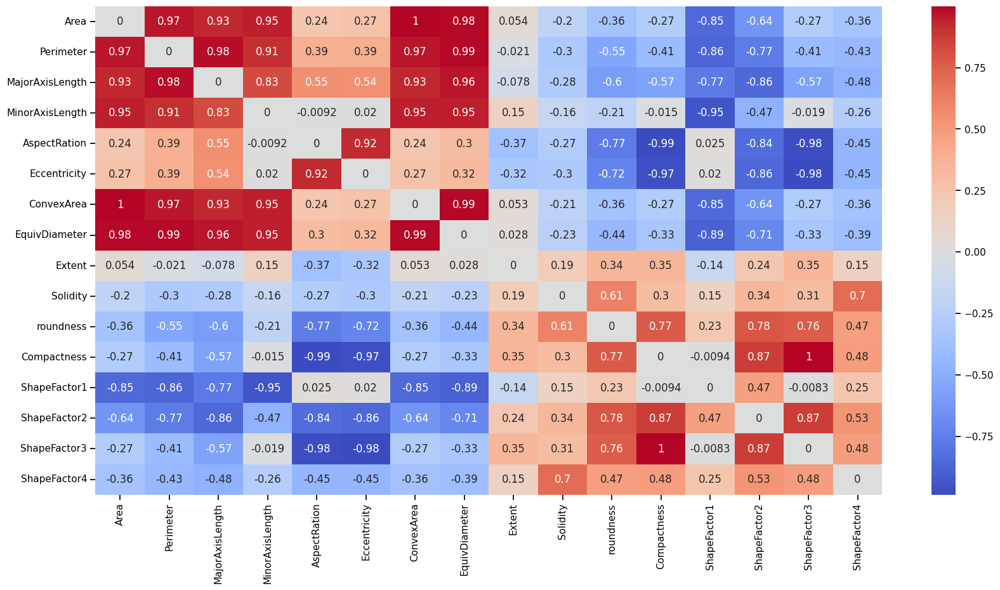

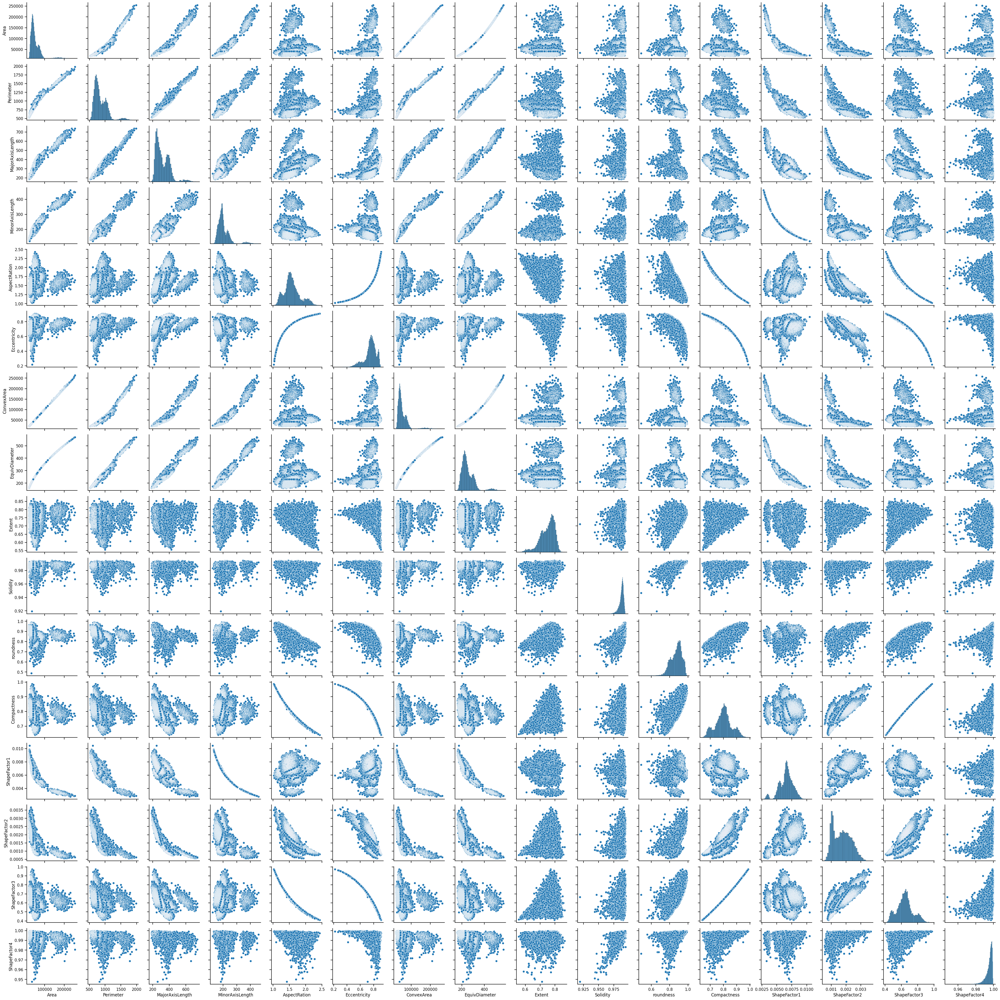

In [170]:
df_only_class = df['Class'].copy()
df = df.drop(['Class'], axis=1) #drop the class column as it is not needed for clustering

corr_mat = df.corr() #correlation matrix

for x in range(corr_mat.shape[0]): #set diagonal values to 0.0
    corr_mat.iloc[x,x] = 0.0 
    
print(corr_mat) 

plt.figure(figsize=(20,10))
sns.heatmap(corr_mat, annot=True, cmap='coolwarm')
plt.show()

sns.pairplot(df)
plt.show()



## The correlation matrix shows that some of the features are indeed connected to each other, which means that we can use PCA to reduce the dimensionality of the dataset.

In [171]:
#dataframe agrigation and processing/plotting

feat_correlation = pd.merge(corr_mat.abs().max().to_frame('max_corr'), corr_mat.idxmax().to_frame('max_corr_feat'), left_index=True, right_index=True) #merge max correlation and max correlation feature into one dataframe

feat_correlation 

,max_corr,max_corr_feat
Area,1.00,ConvexArea
Perimeter,0.99,EquivDiameter
MajorAxisLength,0.98,Perimeter
MinorAxisLength,0.95,Area
AspectRation,0.99,Eccentricity
Eccentricity,0.98,AspectRation
ConvexArea,1.00,Area
EquivDiameter,0.99,Perimeter
Extent,0.37,Compactness
Solidity,0.70,ShapeFactor4


In [172]:
#using PCA to reduce the dimensionality of the dataset

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(df)

scaled_data = scaler.transform(df)


df_1 = pd.DataFrame(scaled_data, columns=df.columns)

print(df.head())

pca = PCA(n_components=2) 
pca.fit(scaled_data)

x_pca = pca.transform(scaled_data)

df_pca = pd.DataFrame(x_pca, columns=['PC1', 'PC2'])
df_pca.head()




    Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0  28395     610.29           208.18           173.89          1.20   
1  28734     638.02           200.52           182.73          1.10   
2  29380     624.11           212.83           175.93          1.21   
3  30008     645.88           210.56           182.52          1.15   
4  30140     620.13           201.85           190.28          1.06   

   Eccentricity  ConvexArea  EquivDiameter  Extent  Solidity  roundness  \
0          0.55       28715         190.14    0.76      0.99       0.96   
1          0.41       29172         191.27    0.78      0.98       0.89   
2          0.56       29690         193.41    0.78      0.99       0.95   
3          0.50       30724         195.47    0.78      0.98       0.90   
4          0.33       30417         195.90    0.77      0.99       0.98   

   Compactness  ShapeFactor1  ShapeFactor2  ShapeFactor3  ShapeFactor4  
0         0.91          0.01          0.00       

,PC1,PC2
0,-4.98,1.82
1,-5.44,2.93
2,-4.76,1.83
3,-4.30,2.00
4,-6.35,4.09


#### Now, we have one dataset with PCA applied to it and another one without PCA. We will use both of them to train our models and compare the results.

## Clustering

In [173]:
def find_correct_perc(df):
    df['Class'] = df_only_class
    df['Class'].replace({'DERMASON':0, 'SIRA':1, 'SEKER':2, 'HOROZ':3, 'CALI':4, 'BARBUNYA':5, 'BOMBAY':6}, inplace=True)
    df['cluster'].replace({0:0, 1:1, 2:2, 3:3, 4:4, 5:5, -1:6}, inplace=True)

    return print('Correctly clustered: ', (df['Class'] == df['cluster']).sum()/df.shape[0]*100, '%')

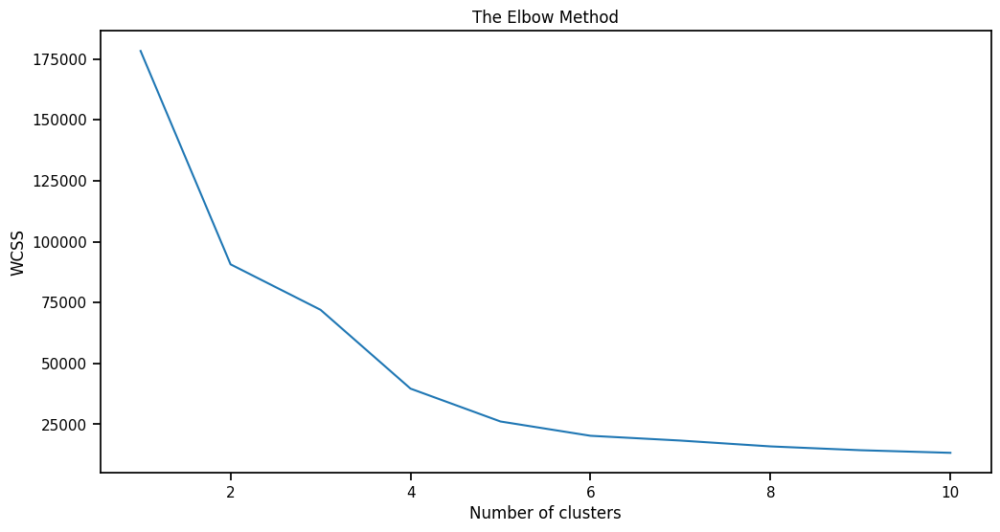

In [174]:
#KMeans clustering
k_l = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(df_pca)
    k_l.append(kmeans.inertia_)

plt.figure(figsize=(12,6))
plt.plot(range(1, 11), k_l)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


    Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0  28395     610.29           208.18           173.89          1.20   
1  28734     638.02           200.52           182.73          1.10   
2  29380     624.11           212.83           175.93          1.21   
3  30008     645.88           210.56           182.52          1.15   
4  30140     620.13           201.85           190.28          1.06   

   Eccentricity  ConvexArea  EquivDiameter  Extent  Solidity  roundness  \
0          0.55       28715         190.14    0.76      0.99       0.96   
1          0.41       29172         191.27    0.78      0.98       0.89   
2          0.56       29690         193.41    0.78      0.99       0.95   
3          0.50       30724         195.47    0.78      0.98       0.90   
4          0.33       30417         195.90    0.77      0.99       0.98   

   Compactness  ShapeFactor1  ShapeFactor2  ShapeFactor3  ShapeFactor4  
0         0.91          0.01          0.00       

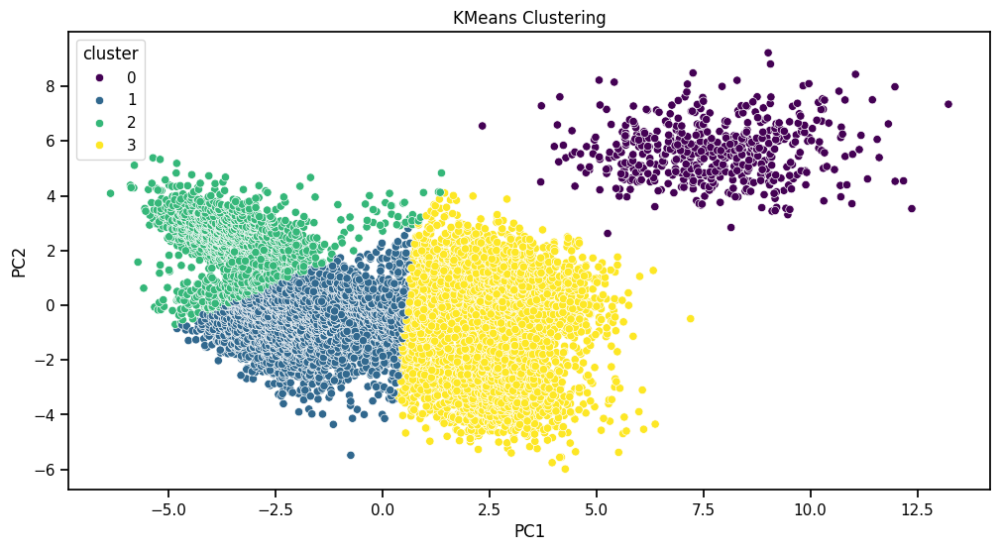

   Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0 -0.84      -1.14            -1.31            -0.63         -1.57   
1 -0.83      -1.01            -1.40            -0.43         -1.97   
2 -0.81      -1.08            -1.25            -0.59         -1.51   
3 -0.79      -0.98            -1.28            -0.44         -1.74   
4 -0.78      -1.10            -1.38            -0.27         -2.12   

   Eccentricity  ConvexArea  EquivDiameter  Extent  Solidity  roundness  \
0         -2.19       -0.84          -1.06    0.29      0.37       1.42   
1         -3.69       -0.83          -1.04    0.70     -0.46       0.23   
2         -2.05       -0.81          -1.01    0.58      0.52       1.25   
3         -2.74       -0.77          -0.97    0.67     -2.24       0.52   
4         -4.54       -0.78          -0.97    0.48      0.80       1.87   

   Compactness  ShapeFactor1  ShapeFactor2  ShapeFactor3  ShapeFactor4  \
0         1.84          0.68          2.40          1.

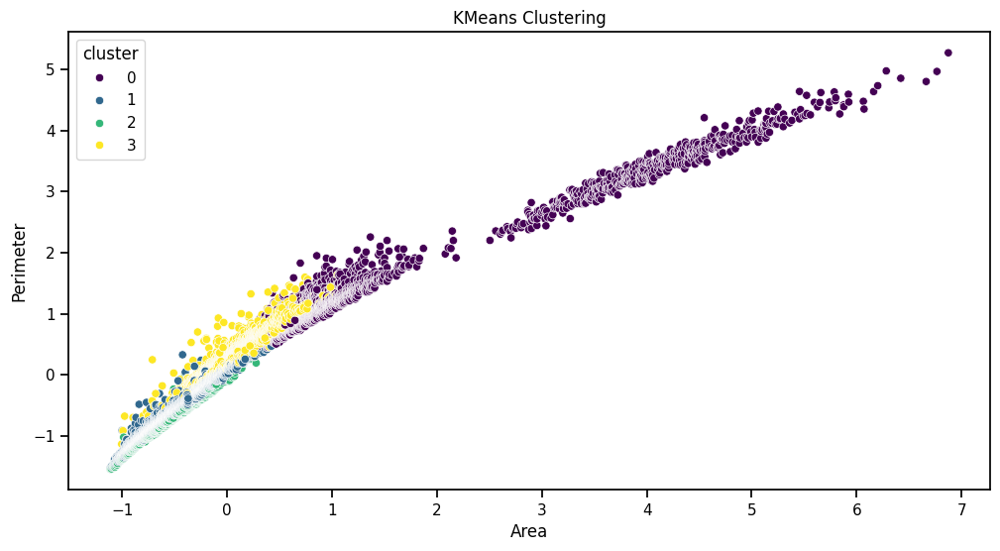

With PCA: 
Correctly clustered:  44.69179340239512 %
Without PCA: 
Correctly clustered:  45.235471309969874 %


In [175]:
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=42)
kmeans.fit(df_pca)
df_pca['cluster'] = kmeans.predict(df_pca)
print(df.head())

plt.figure(figsize=(12,6))
sns.scatterplot(x='PC1', y='PC2', data=df_pca, hue='cluster', palette='viridis')
plt.title('KMeans Clustering')
plt.show()

df_pca['cluster'].value_counts()


kmeans = KMeans(n_clusters=4, init='k-means++', random_state=42)
kmeans.fit(df_1)
df_1['cluster'] = kmeans.predict(df_1)
print(df_1.head())

plt.figure(figsize=(12,6))
sns.scatterplot(x='Area', y='Perimeter', data=df_1, hue='cluster', palette='viridis')
plt.title('KMeans Clustering')
plt.show()


print("With PCA: ")
find_correct_perc(df_pca)
print("Without PCA: ")
find_correct_perc(df_1)


# Mean Shift

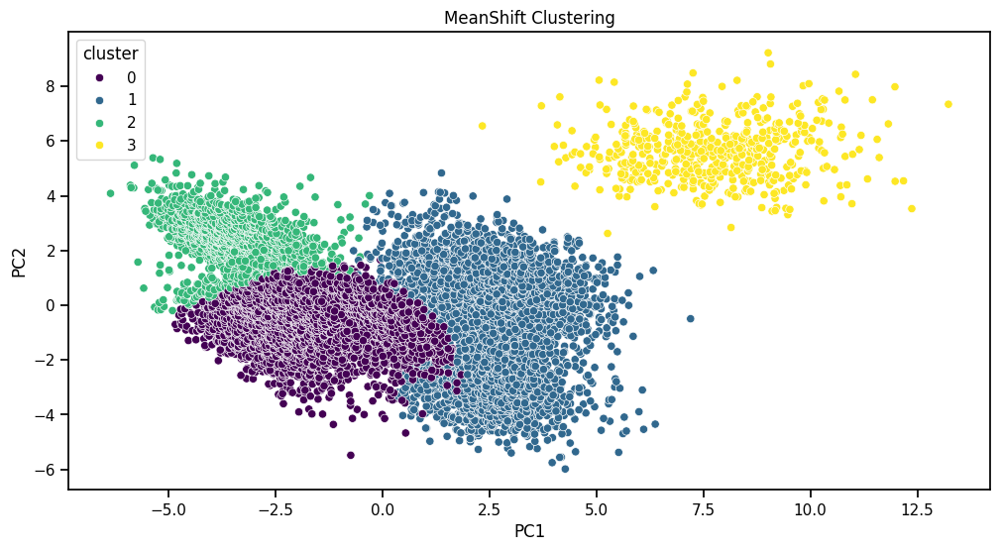

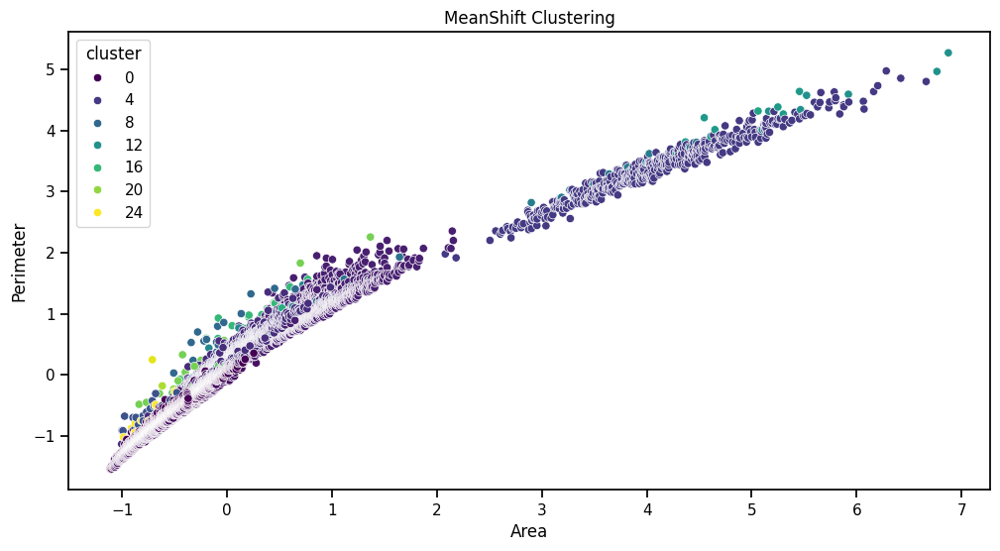

With PCA: 
Correctly clustered:  39.32113731540666 %
Without PCA: 
Correctly clustered:  38.11622952024098 %


In [176]:
ms = MeanShift(bandwidth=2.5, n_jobs=-1)
ms.fit(df_pca)
df_pca['cluster'] = ms.predict(df_pca)

plt.figure(figsize=(12,6))
sns.scatterplot(x='PC1', y='PC2', data=df_pca, hue='cluster', palette='viridis')
plt.title('MeanShift Clustering')
plt.show()

df_pca['cluster'].value_counts()


ms = MeanShift(bandwidth=2.5, n_jobs=-1)
ms.fit(df_1)
df_1['cluster'] = ms.predict(df_1)

plt.figure(figsize=(12,6))
sns.scatterplot(x='Area', y='Perimeter', data=df_1, hue='cluster', palette='viridis')
plt.title('MeanShift Clustering')
plt.show()





print("With PCA: ")
find_correct_perc(df_pca)
print("Without PCA: ")
find_correct_perc(df_1)


## DBSCAN

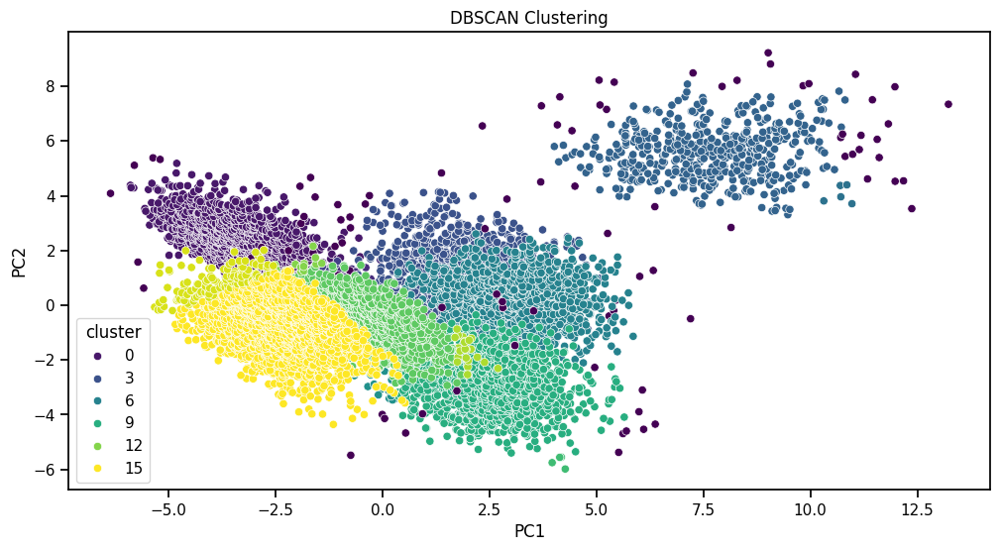

With PCA: 
Correctly clustered:  0.26449195503636763 %
Without PCA: 
Correctly clustered:  38.11622952024098 %


In [177]:
dbscan = DBSCAN(eps=0.5, min_samples=5, metric='euclidean', n_jobs=-1)
dbscan.fit(df_pca)
df_pca['cluster'] = dbscan.labels_



plt.figure(figsize=(12,6))
sns.scatterplot(x='PC1', y='PC2', data=df_pca, hue='cluster', palette='viridis')
plt.title('DBSCAN Clustering')
plt.show()


print("With PCA: ")
find_correct_perc(df_pca)
print("Without PCA: ")
find_correct_perc(df_1)

### Conclusion

#### After the aplication of the PCA, we can see that the accuracy of the models increased. The best model was the KMeans with PCA, both for finding the best number of clusters and for the classification, also for time performance.


### Key Findings, Insights and Next Steps

#### As the dataset is unbalanced, we can see that the models have a better performance for the classes with more samples. For the classes with less samples, the models have a worse performance. We can try to balance the dataset to see if the models will have a better performance for the classes with less samples. Also, we can try to use other models to see if we can improve the accuracy of the classification (Like Agglomerative Clustering, for example).
